In [1]:
import pandas as pd
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm
import datetime
import numpy as np

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_percentage_error

from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectPercentile, chi2
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn import tree


pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
%matplotlib inline

In [21]:
housing = pd.read_csv("../datasets/melb_data.csv")

# Aufgabenverständnis

In [22]:
housing.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-12-3,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-4,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-4,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-03-4,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-4,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


In [23]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

## Bedeutung der Merkmale
- Price: Price in dollars
- Method:
    - S - property sold
    - SP - property sold prior
    - PI - property passed in
    - PN - sold prior not disclosed
    - SN - sold not disclosed
    - NB - no bid
    - VB - vendor bid
    - W - withdrawn prior to auction
    - SA - sold after auction
    - SS - sold after auction price not disclosed
    - N/A - price or highest bid not available.
- Type:
    - br - bedroom(s)
    - h - house,cottage,villa,semi,terrace
    - u - unit, duplex
    - t - townhouse
    - dev site - development site
    - o res - other residential.
- SellerG: Immobilienmarkler
- Date: Verkaufsdatum
- Distance: Distanz von CBD
- Regionname: General Region (West, North West, North, North east …etc)
- Propertycount: Allgemeine Anzahl an Grundstücken im Vorort
- Bedroom2 : Scraped # of Bedrooms (from different source)
- Bathroom: Anzahl an Badezimmern
- Car: Anzahl an Carports
- Landsize: Grundstücksgröße
- BuildingArea: Wohnfläche
- CouncilArea: Bezirk

# Datenverständnis

In [24]:
housing["Suburb"] = housing["Suburb"].astype("category")
housing["Type"] = housing["Type"].astype("category")
housing["Method"] = housing["Method"].astype("category")
housing["SellerG"] = housing["SellerG"].astype("category")
housing["CouncilArea"] = housing["CouncilArea"].astype("category")
housing["Postcode"] = housing["Postcode"].astype("category")
housing["Regionname"] = housing["Regionname"].astype("category")
#housing["Address"] = housing["Address"].astype("category")



housing["Date"] = pd.to_datetime(housing["Date"])

In [6]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  category      
 1   Address        13580 non-null  category      
 2   Rooms          13580 non-null  int64         
 3   Type           13580 non-null  category      
 4   Price          13580 non-null  float64       
 5   Method         13580 non-null  category      
 6   SellerG        13580 non-null  category      
 7   Date           13580 non-null  datetime64[ns]
 8   Distance       13580 non-null  float64       
 9   Postcode       13580 non-null  category      
 10  Bedroom2       13580 non-null  float64       
 11  Bathroom       13580 non-null  float64       
 12  Car            13518 non-null  float64       
 13  Landsize       13580 non-null  float64       
 14  BuildingArea   7130 non-null   float64       
 15  YearBuilt      8205

### Numerischen Merkmale

In [7]:
housing.describe()

,Rooms,Price,Date,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,2017-01-28 20:25:03.622974976,10.137776,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
min,1.000000,8.500000e+04,2016-01-28 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,2016-09-10 00:00:00,6.100000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,2017-03-04 00:00:00,9.200000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,2017-06-24 00:00:00,13.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,2017-09-23 00:00:00,48.100000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000
std,0.955748,6.393107e+05,NaN,5.868725,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772


### Kategorische Merkmale

In [8]:
housing.describe(include="category")

,Suburb,Address,Type,Method,SellerG,Postcode,CouncilArea,Regionname
count,13580,13580,13580,13580,13580,13580.0,12211,13580
unique,314,13378,3,5,268,198.0,33,8
top,Reservoir,5 Charles St,h,S,Nelson,3073.0,Moreland,Southern Metropolitan
freq,359,3,9449,9022,1565,359.0,1163,4695


In [25]:
target_name = "Price"
data, target = (
    housing.drop(columns=target_name),
    housing[target_name],
)
numeric_data = data.select_dtypes("number")
numeric_data_colnames = list(numeric_data.columns)
string_data = data.select_dtypes("category")
string_data_colnames = list(string_data.columns)

### Fehlwerte

<Axes: >

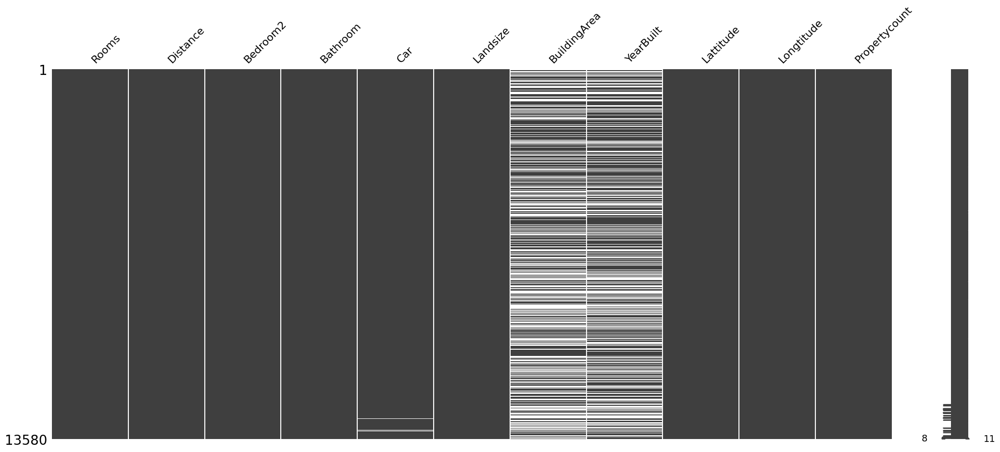

In [10]:
msno.matrix(numeric_data)

<Axes: >

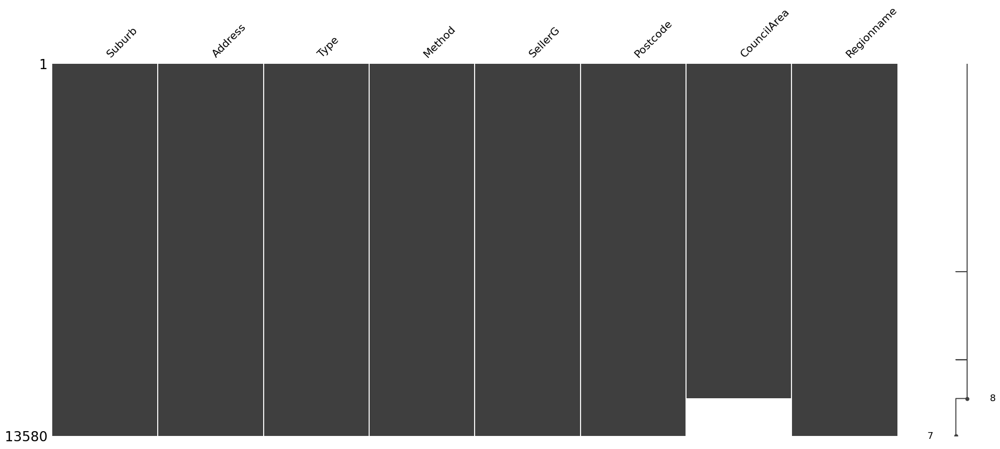

In [11]:
msno.matrix(string_data)

## Visualisierungen

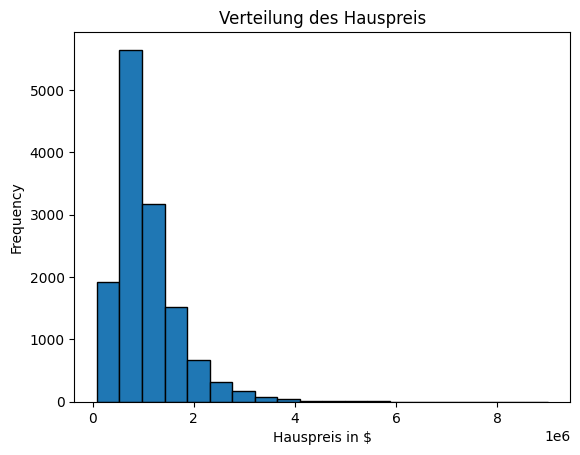

In [12]:
target.plot.hist(bins=20, edgecolor="black")
plt.xlabel("Hauspreis in $")
_ = plt.title("Verteilung des Hauspreis")

## Univariate Verteilung
### Histogramme der numerischen Merkmale

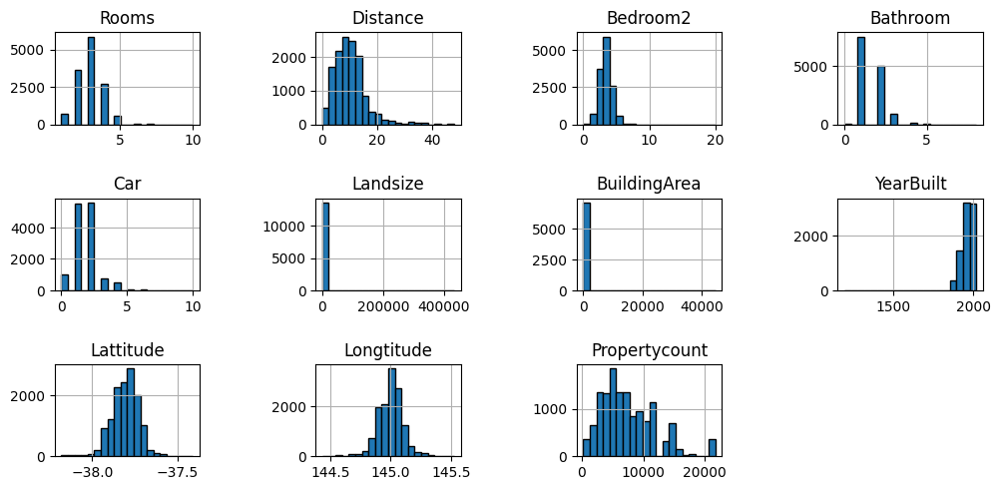

In [13]:
numeric_data.hist(
    bins=20, figsize=(12, 12), edgecolor="black", layout=(6, 4)
)
plt.subplots_adjust(hspace=0.8, wspace=0.8)

## Multivariate Verteilung
### Merkmal gegen Preis

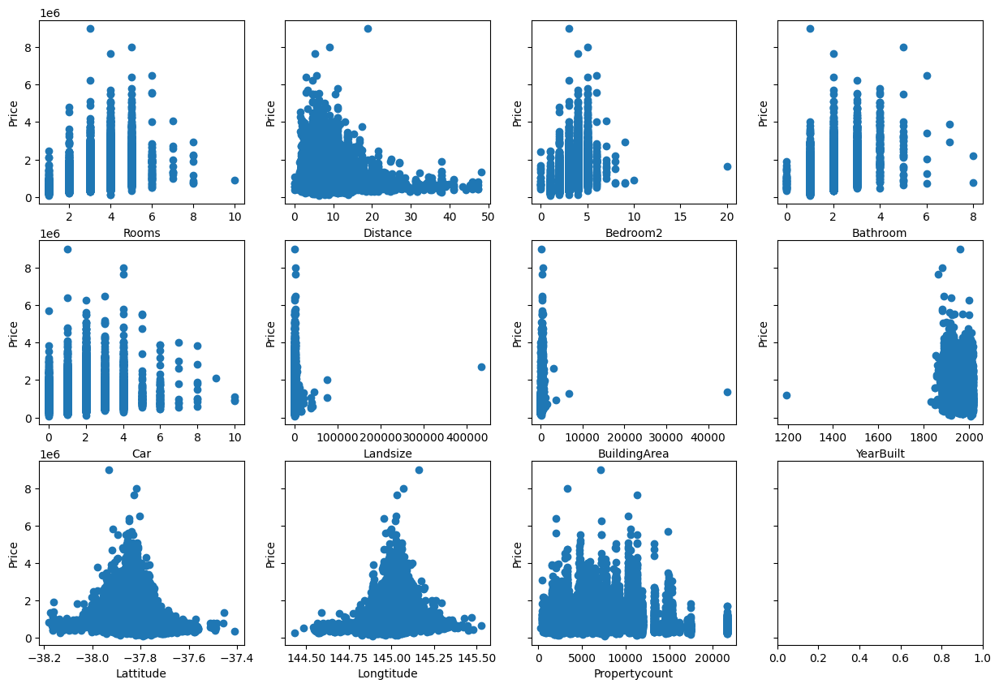

In [14]:
fig, axs = plt.subplots(3, 4, sharey=True)
for i,ax in enumerate(axs.reshape(-1)):
    if i == len(numeric_data_colnames):
        break
    ax.scatter(x=numeric_data[numeric_data_colnames[i]], y=target)
    ax.set_xlabel(numeric_data_colnames[i])
    ax.set_ylabel("Price")
fig.set_size_inches(15, 10)

## Die kategorischen Merkmale

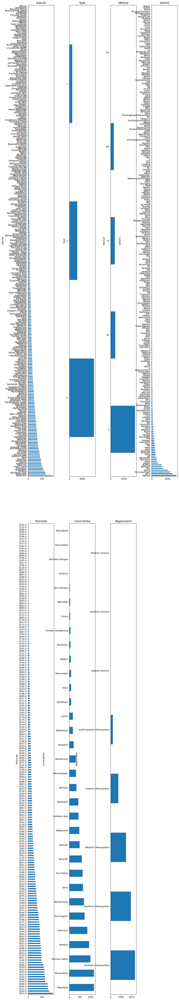

In [26]:
from math import ceil
from itertools import zip_longest

n_string_features = string_data.shape[1]
nrows, ncols = ceil(n_string_features / 4), 4

fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(12, 80))

for feature_name, ax in zip_longest(string_data, axs.ravel()):
    if feature_name is None:
        # do not show the axis
        ax.axis("off")
        continue

    string_data[feature_name].value_counts().plot.barh(ax=ax)
    ax.set_title(feature_name)

plt.subplots_adjust(hspace=0.1, wspace=0.6)

## Multivariate Verteilung der Geodaten

<Axes: xlabel='Longtitude', ylabel='Lattitude'>

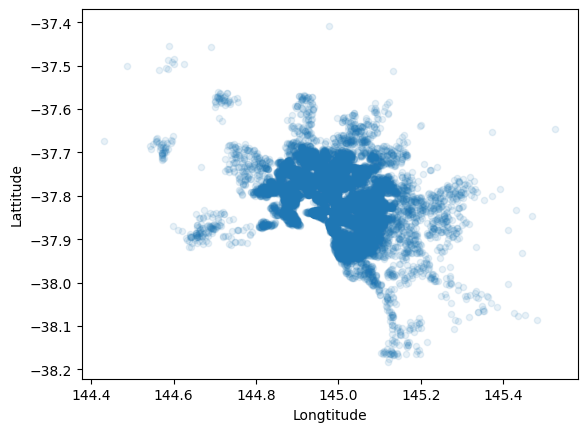

In [77]:
housing.plot(kind="scatter", x="Longtitude", y="Lattitude", alpha=0.1)

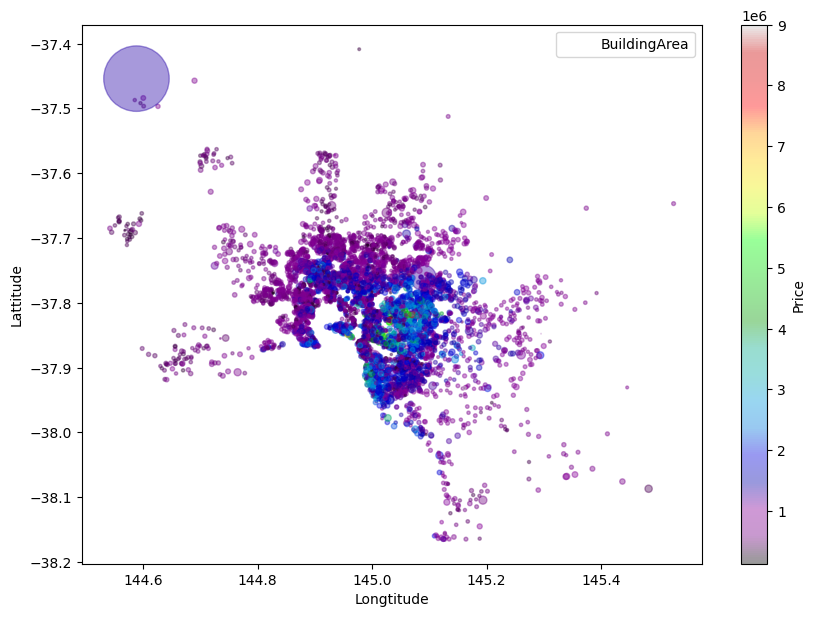

In [78]:
housing.plot(kind="scatter", x="Longtitude", y="Lattitude", alpha=0.4,
    s=housing["BuildingArea"]/20, label="BuildingArea", figsize=(10,7),
    c="Price", cmap=plt.get_cmap("nipy_spectral"), colorbar=True,
)
plt.legend()

In [28]:
housing["Price_m2"] = housing["Price"] / housing["Landsize"]

### Hinzufügen von Kartenmaterial

In [31]:
housing["Price_m2"].describe()

/Users/mako6/Library/Caches/pypoetry/virtualenvs/ki-grundlagen-prehcm-2024-3tqpqaQ1-py3.11/lib/python3.11/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


count    1.358000e+04
mean              inf
std               NaN
min      6.235364e+00
25%      1.536194e+03
50%      2.756911e+03
75%      5.774390e+03
max               inf
Name: Price_m2, dtype: float64

In [32]:
cmap = cm.linear.Spectral_10
colormap = cmap.to_step(index=[0, 500, 1000, 5000, 10000, 20000])
colormap.colors = colormap.colors[::-1]

x_mean = housing['Lattitude'].mean() 
y_mean = housing['Longtitude'].mean()
    
m = folium.Map(location=[x_mean, y_mean], zoom_start=11)


for i, house in housing.iterrows():
    if i == 20000:
        break
    x = house['Lattitude']
    y = house['Longtitude']
    folium.Circle(location=(x, y), radius=100, stroke=True, weight=1,
                  tooltip=house["BuildingArea"]/50,
                  fill_color=colormap(house["Price_m2"]),
                  fill=True, fill_opacity=.7,
                  color=None
                 ).add_to(m)


colormap.caption = 'Price'
colormap.add_to(m)

m

## Korrelationen

In [33]:
housing.corr(numeric_only=True)

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount,Price_m2
Rooms,1.000000,0.496634,0.294203,0.944190,0.592934,0.408483,0.025678,0.124127,-0.065413,0.015948,0.100771,-0.081530,-0.034906
Price,0.496634,1.000000,-0.162522,0.475951,0.467038,0.238979,0.037507,0.090981,-0.323617,-0.212934,0.203656,-0.042153,0.088396
Distance,0.294203,-0.162522,1.000000,0.295927,0.127155,0.262994,0.025004,0.099481,0.246379,-0.130723,0.239425,-0.054910,-0.131659
Bedroom2,0.944190,0.475951,0.295927,1.000000,0.584685,0.405325,0.025646,0.122319,-0.053319,0.015925,0.102238,-0.081350,-0.034529
Bathroom,0.592934,0.467038,0.127155,0.584685,1.000000,0.322246,0.037130,0.111933,0.152702,-0.070594,0.118971,-0.052201,0.024881
Car,0.408483,0.238979,0.262994,0.405325,0.322246,1.000000,0.026770,0.096101,0.104515,-0.001963,0.063395,-0.024295,-0.059262
Landsize,0.025678,0.037507,0.025004,0.025646,0.037130,0.026770,1.000000,0.500485,0.036451,0.009695,0.010833,-0.006854,-0.024123
BuildingArea,0.124127,0.090981,0.099481,0.122319,0.111933,0.096101,0.500485,1.000000,0.019665,0.043420,-0.023810,-0.028840,-0.009436
YearBuilt,-0.065413,-0.323617,0.246379,-0.053319,0.152702,0.104515,0.036451,0.019665,1.000000,0.060445,-0.003470,0.006361,-0.072023
Lattitude,0.015948,-0.212934,-0.130723,0.015925,-0.070594,-0.001963,0.009695,0.043420,0.060445,1.000000,-0.357634,0.047086,-0.040400


### Korrelation zur Zielgröße

In [34]:
housing.corr(numeric_only=True)['Price'].sort_values(ascending=False)

Price            1.000000
Rooms            0.496634
Bedroom2         0.475951
Bathroom         0.467038
Car              0.238979
Longtitude       0.203656
BuildingArea     0.090981
Price_m2         0.088396
Landsize         0.037507
Propertycount   -0.042153
Distance        -0.162522
Lattitude       -0.212934
YearBuilt       -0.323617
Name: Price, dtype: float64

# Datenvorbereitung

In [36]:
housing = housing.drop(columns=["Price_m2"])

In [37]:
data = housing.copy()

## Ersetze Datum durch Alter

In [86]:
data["month_sold"] = housing["Date"].dt.month
data["years_span_sold"] = datetime.datetime.now().year - housing["Date"].dt.year
data["years_span_built"] = datetime.datetime.now().year - housing["YearBuilt"]
data.drop(columns=["Date", "YearBuilt"], inplace=True)

## Handhabung von seltenen Kategorien

### Junk Class

### Auflösung verringern

#### Postleitzahl

In [87]:
housing["postcode_red"] = (housing["Postcode"].astype(int)/10).round(0).astype(int).astype("category")

## Handhabung von Extremwerten

## Behandlung von Fehlwerten

In [88]:
from sklearn.impute import SimpleImputer


### Fehlwertspalte

In [90]:
imputer = SimpleImputer(strategy="median")
imputer.fit(df_input["BuildingArea"].values.reshape(-1, 1))

SimpleImputer(strategy='median')

In [91]:
df_input["BuildingArea"] = imputer.transform(df_input["BuildingArea"].values.reshape(-1, 1))

In [92]:
df_input.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Suburb         13580 non-null  category
 1   Rooms          13580 non-null  int64   
 2   Type           13580 non-null  category
 3   Price          13580 non-null  float64 
 4   Method         13580 non-null  category
 5   SellerG        13580 non-null  category
 6   Distance       13580 non-null  float64 
 7   Postcode       13580 non-null  category
 8   Bedroom2       13580 non-null  float64 
 9   Bathroom       13580 non-null  float64 
 10  Car            13518 non-null  float64 
 11  Landsize       13580 non-null  float64 
 12  BuildingArea   13580 non-null  float64 
 13  YearBuilt      8205 non-null   float64 
 14  CouncilArea    12211 non-null  category
 15  Regionname     13580 non-null  category
 16  Propertycount  13580 non-null  float64 
dtypes: category(7), float64(9), int

In [93]:
imputer.fit(df_input[["BuildingArea", "Car", "YearBuilt"]])

SimpleImputer(strategy='median')

In [94]:
df_input[["BuildingArea", "Car", "YearBuilt"]] = imputer.transform(df_input[["BuildingArea", "Car", "YearBuilt"]])

## Feature Engineering

## Aus Addresse etwaw sinnvolles machen

Extrahieren des Straßennamen
https://en.wikipedia.org/wiki/Street_suffix#Australia

In [95]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  category      
 1   Address        13580 non-null  object        
 2   Rooms          13580 non-null  int64         
 3   Type           13580 non-null  category      
 4   Price          13580 non-null  float64       
 5   Method         13580 non-null  category      
 6   SellerG        13580 non-null  category      
 7   Date           13580 non-null  datetime64[ns]
 8   Distance       13580 non-null  float64       
 9   Postcode       13580 non-null  category      
 10  Bedroom2       13580 non-null  float64       
 11  Bathroom       13580 non-null  float64       
 12  Car            13518 non-null  float64       
 13  Landsize       13580 non-null  float64       
 14  BuildingArea   7130 non-null   float64       
 15  YearBuilt      8205

In [96]:
housing.Address.str.split().apply(lambda x: x[-1]).value_counts().iloc[2:].sum()

housing.Address.str.split().apply(lambda x: x[-1]).value_counts()


Address
St           8004
Rd           2824
Ct            612
Dr            447
Av            321
Gr            311
Pde           209
Pl            168
Cr            152
Cl            100
La             67
Bvd            53
Tce            47
Wy             40
Avenue         40
Cct            25
Hwy            24
Parade         15
Boulevard      13
Sq             11
Crescent        9
N               7
Strand          7
Cir             7
Esplanade       6
Grove           5
Gdns            4
Grn             4
Fairway         4
Mews            4
Crossway        3
Righi           3
W               2
S               2
Victoria        2
Ridge           2
Crofts          2
Esp             2
Glade           1
Grand           1
Ave             1
Woodland        1
E               1
Outlook         1
Hts             1
Highway         1
Athol           1
Grange          1
Summit          1
Gra             1
Nook            1
Eyrie           1
Dell            1
East            1
Loop            1
Re

## Trainings und Testdatensatz erstellen

In [97]:
y = data["Price"]
X = data.drop(columns=["Price"])

num_columns = list(X.select_dtypes("number").columns)
cat_columns = list(X.select_dtypes("category").columns)

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

## Machine Learning Pipeline

In [99]:
numeric_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),
    ]
)

categorical_transformer = Pipeline(
    steps=[
        ("most_frequent_imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore")),
    ]
)
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, num_columns),
        ("cat", categorical_transformer, cat_columns),
    ]
)

## Qualitätsmaße definieren

In [100]:
def print_quality(y_test, y_pred):
    print("RSME: {:,.0f} $".format(np.sqrt(mean_squared_error(y_test, y_pred))))
    print("MAE: {:,.0f} $".format(mean_absolute_error(y_test, y_pred)))
    print(f"R2: {r2_score(y_test, y_pred):.3f}")

print(f"Mittlerer Verkaufspreis: {y_train.mean():,.0f} $")
print_quality(y_test, np.zeros_like(y_test)+y_train.mean())

Mittlerer Verkaufspreis: 1,076,087 $
RSME: 628,624 $
MAE: 465,387 $
R2: -0.000


## Lineare Regression

In [101]:
linear_regressor = Pipeline(
    steps=[("preprocessor", preprocessor), ("regressor", LinearRegression())]
)

linear_regressor.fit(X_train, y_train)
print(y_test - linear_regressor.predict(X_test))
print("---")
print_quality(y_test, linear_regressor.predict(X_test))

8505     340776.022863
5523      -7777.476886
12852   -173827.518877
4818     -46359.844980
12812    -18273.324285
             ...      
2664     100071.571925
8513    -364278.975230
12922    269242.727024
10761   -372132.532814
2110    -203432.566456
Name: Price, Length: 2716, dtype: float64
---
RSME: 348,613 $
MAE: 234,905 $
R2: 0.692


## Entscheidungsbaum

In [102]:
decision_regressor = Pipeline(
    steps=[("preprocessor", preprocessor), ("regressor", DecisionTreeRegressor(max_depth=2))]
)

decision_regressor.fit(X_train, y_train)

print_quality(y_test, decision_regressor.predict(X_test))

RSME: 491,930 $
MAE: 351,559 $
R2: 0.388


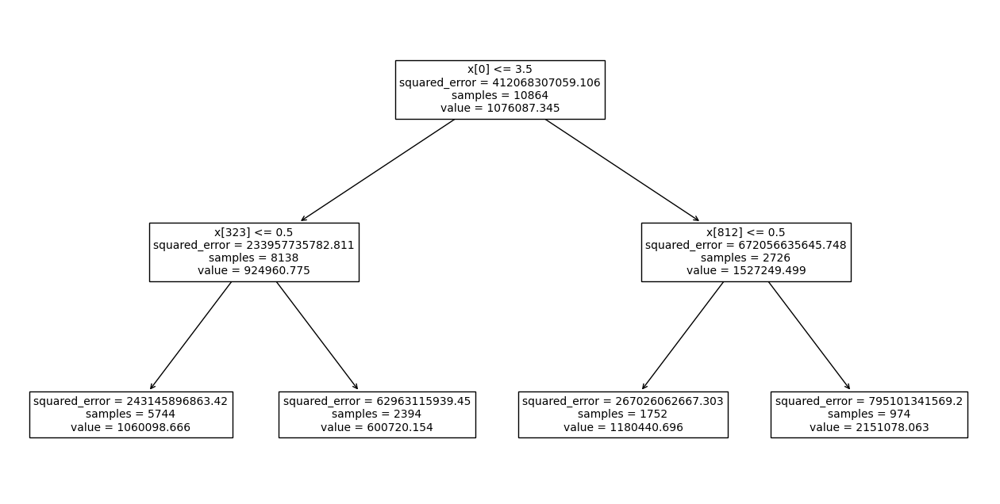

In [103]:
plt.figure(figsize=(16,8))
tree.plot_tree(decision_regressor.named_steps["regressor"], fontsize=10)
plt.show()

### Überanpassung

In [104]:
train_error = []
test_error = []
for max_depth in range(1, 18):
    decision_regressor.set_params(regressor__max_depth=max_depth).fit(X_train, y_train)
    train_predictions = pd.Series(decision_regressor.predict(X_train), index=X_train.index)
    test_predictions = pd.Series(decision_regressor.predict(X_test), index=X_test.index)
    train_error.append(np.sqrt(mean_squared_error(y_train, decision_regressor.predict(X_train))))
    test_error.append(np.sqrt(mean_squared_error(y_test, decision_regressor.predict(X_test))))

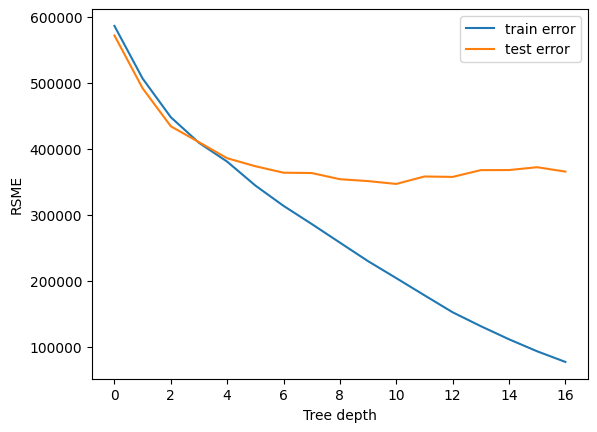

In [105]:
plt.plot(train_error)
plt.plot(test_error)
plt.ylabel("RSME")
plt.xlabel("Tree depth")
plt.legend(["train error", "test error"])
plt.show()

### Hyperparameteroptimierung

In [106]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'regressor__min_samples_split': [2, 3,],
    'regressor__max_depth': [2, 5, 8, 10, 15, 20]
}


grid_search = GridSearchCV(
    decision_regressor,
    param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    return_train_score=True
)

grid_search.fit(X_train, y_train)
grid_search.best_estimator_

print_quality(y_test, grid_search.best_estimator_.predict(X_test))

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Rooms', 'Distance',
                                                   'Bedroom2', 'Bathroom',
                                                   'Car', 'Landsize',
                                                   'BuildingArea', 'Lattitude',
                                                   'Longtitude',
                                                   'Propertycount',
                                                   'month_sold',
                                                   'years_span_sold',
                                                   'years_span_built']),
                                                 ('cat',
                                                  Pipeline(steps=[('most_frequent_imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Suburb', 'Type', 'Method',
                                                   'SellerG', 'Postcode',
                                                   'CouncilArea',
                                                   'Regionname'])])),
                ('regressor', DecisionTreeRegressor(max_depth=8))])

## Random Forest

In [107]:
forest_regressor = Pipeline(
    steps=[("preprocessor", preprocessor), ("regressor", RandomForestRegressor())]
)

forest_regressor.fit(X_train, y_train)

print_quality(y_test, forest_regressor.predict(X_test))

RSME: 264,454 $
MAE: 159,264 $
R2: 0.823


# Deployment

## Serialisierung des Models

In [108]:
numeric_data.Landsize[numeric_data.Landsize == numeric_data.Landsize.max()] = 100000

/var/folders/4m/zbm6lc054ws9njhzxj0l6cghklxfht/T/ipykernel_59590/3887936565.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  numeric_data.Landsize[numeric_data.Landsize == numeric_data.Landsize.max()] = 100000
/var/folders/4m/zbm6lc054ws9

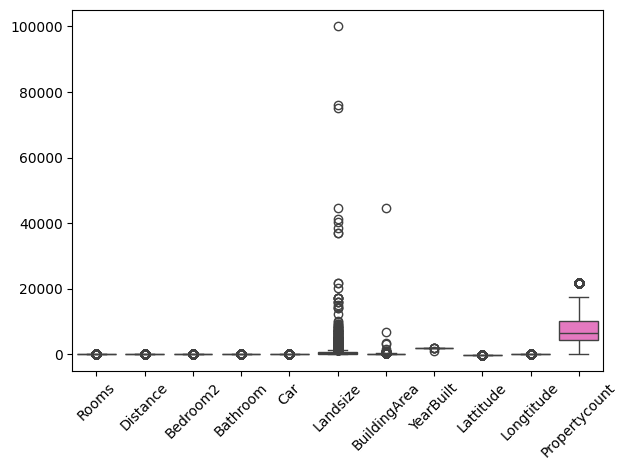

In [109]:
sns.boxplot(numeric_data)
plt.xticks(rotation=45)
plt.tight_layout()

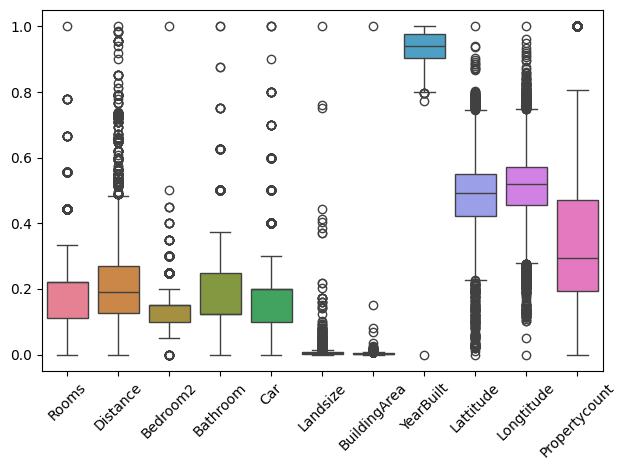

In [110]:
scaler = MinMaxScaler()
saled_data = scaler.fit_transform(numeric_data)
saled_data = pd.DataFrame(saled_data, columns=list(numeric_data.columns))
sns.boxplot(saled_data)
plt.xticks(rotation=45)
plt.tight_layout()

In [111]:
import joblib

joblib.dump(pipeline, "my_model.pkl")

NameError: name 'pipeline' is not defined

In [ ]:
my_model_loaded = joblib.load("my_model.pkl")
my_model_loaded.score(X_test, y_test)

In [ ]:
sample = X_test.iloc[0:2].copy()

In [ ]:
my_model_loaded.predict(sample)

In [ ]:
y_test.iloc[0:2]